# Global analysis of CABG alone
## Analysis date 2022/03/02

In [2]:
import numpy as np
import pandas as pd
import anndata
import scanpy as sc
import seaborn as sns
import harmonypy as hm
import scrublet as scr
import matplotlib.pyplot as plt
from collections import OrderedDict

sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=120, color_map='viridis')
sc.logging.print_versions()


%matplotlib inline

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [5, 5]

import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
anndata     0.7.6
scanpy      1.8.2
sinfo       0.3.4
-----
PIL                         8.4.0
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
bottleneck                  1.3.2
cloudpickle                 2.0.0
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.11.0
dask                        2021.10.0
dateutil                    2.8.2
debugpy                     1.4.1
decorator                   5.1.0
defusedxml

In [2]:
DATE='2022-02-23'

## User defined functions
- Useful functions 

In [3]:
def DEG_table(adata):
    result = adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    markers = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
    return markers

In [4]:
def filtered_DEGs(adata, q_value = 1E-5, fold_change = 1):
    markers = DEG_table(adata)
    groups = adata.uns['rank_genes_groups']['names'].dtype.names
    output = pd.DataFrame()
    for i in groups:
        temp = markers[(markers.loc[:,i+'_p'] <= q_value) & (markers.loc[:,i+'_l'] >= fold_change)].loc[:,(i+'_n'):(i+'_l')]
        temp.reset_index(inplace=True, drop=True)
        output = output.join(temp, how='outer')
    return output

In [5]:
def filtered_DEG_names(adata, q_value = 1E-5, fold_change = 1):
    markers = DEG_table(adata)
    groups = adata.uns['rank_genes_groups']['names'].dtype.names
    output = pd.DataFrame()
    for i in groups:
        temp = markers[(markers.loc[:,i+'_p'] <= q_value) & (markers.loc[:,i+'_l'] >= fold_change)].loc[:,(i+'_n')]
        temp.reset_index(inplace=True, drop=True)
        output = output.join(temp, how='outer')
    return output

In [6]:
def filtered_down_reg_DEGs(adata, q_value = 1E-5, fold_change = -1):
    markers = DEG_table(adata)
    groups = adata.uns['rank_genes_groups']['names'].dtype.names
    output = pd.DataFrame()
    for i in groups:
        temp = markers[(markers.loc[:,i+'_p'] <= q_value) & (markers.loc[:,i+'_l'] <= fold_change)].loc[:,(i+'_n'):(i+'_l')]
        temp.reset_index(inplace=True, drop=True)
        output = output.join(temp, how='outer')
    return output

In [7]:
def filtered_down_reg_DEG_names(adata, q_value = 1E-5, fold_change = -1):
    markers = DEG_table(adata)
    groups = adata.uns['rank_genes_groups']['names'].dtype.names
    output = pd.DataFrame()
    for i in groups:
        temp = markers[(markers.loc[:,i+'_p'] <= q_value) & (markers.loc[:,i+'_l'] <= fold_change)].loc[:,(i+'_n')]
        temp.reset_index(inplace=True, drop=True)
        output = output.join(temp, how='outer')
    return output

In [8]:
def stacked_barplot(adata, xaxis, stack, xaxis_label, legend_label, shift_top=0.2, xaxis_rotation=45, figsize=(10,10), percent=True, save=None):
    tmp=pd.crosstab(adata.obs[xaxis],
                adata.obs[stack]).sum(axis=1)
    
    ax= pd.crosstab(adata.obs[xaxis], 
                    adata.obs[stack]).apply(lambda r: r/r.sum()*100, axis=1)
    #ax_1 = ax.plot.bar(figsize=(10,10),stacked=True, rot=0, colors=colors)
    ax_1 = ax.plot.bar(figsize=figsize,stacked=True, rot=0)
    #display(ax)
    #plt.legend(title="Subject") # loc='upper center', bbox_to_anchor=(0.1, 1.0), 
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title=legend_label)
    plt.xlabel(xaxis_label,fontweight="bold")
    plt.ylabel('Percent Distribution',fontweight="bold")
    
    if percent:
        for rec in ax_1.patches:
            height = rec.get_height()
            ax_1.text(rec.get_x() + rec.get_width() / 2, rec.get_y() + height/2, "{:.0f}%".format(height),
                   ha = 'center', va='center', fontsize=14.5, weight='bold') #
    
    for xaxistick in range(ax.shape[0]):
        ax_1.text(xaxistick-shift_top,110,tmp[xaxistick],va='center', rotation=45, fontsize=14.5, weight='bold')
    
    plt.xticks(rotation=xaxis_rotation, ha = 'right')
    
    ax_1.grid(False)
    if save is not None:
        plt.savefig(save, bbox_inches='tight')
    
    plt.show()

In [9]:
def multivariateGrid(col_x, col_y, col_k, df, k_is_color=False, scatter_alpha=.5, scatter_size=4):
    def colored_scatter(x, y, c=None, scatter_size=scatter_size):
        def scatter(*args, **kwargs):
            args = (x, y)
            if c is not None:
                kwargs['c'] = c
            kwargs['alpha'] = scatter_alpha
            plt.scatter(*args, **kwargs, s=scatter_size)

        return scatter

    g = sns.JointGrid(
        x=col_x,
        y=col_y,
        data=df
    )
    color = None
    legends=[]
    for name, df_group in df.groupby(col_k):
        legends.append(name)
        if k_is_color:
            color=name
        g.plot_joint(
            colored_scatter(df_group[col_x],df_group[col_y],color),
        )
        sns.distplot(
            df_group[col_x].values,
            ax=g.ax_marg_x,
            color=color,
        )
        sns.distplot(
            df_group[col_y].values,
            ax=g.ax_marg_y,
            color=color,            
            vertical=True
        )

    plt.legend(legends)

In [10]:
# adata_obj should be your Anndata object. sc.tl.rank_genes_groups needs to be run first!
# DE_column the column you performed your DE test on, e.g. leiden or Gene.

def filter_by_expression(adata_obj, DE_column, key='rank_genes_groups'):
#adata_obj=fbs_new_harmony.copy()
#key='rank_genes_groups'
#DE_column='leiden'
    def to_tensor(dataframe, columns = [], dtypes = {}, index = False):
        to_records_kwargs = {'index': index}
        if not columns:  # Default to all `dataframe.columns`
            columns = dataframe.columns
        if dtypes:       # Pull in modifications only for dtypes listed in `columns`
            to_records_kwargs['column_dtypes'] = {}
            for column in dtypes.keys():
                if column in columns:
                    to_records_kwargs['column_dtypes'].update({column: dtypes.get(column)})
        return dataframe[columns].to_records(**to_records_kwargs)
    
    gene_names = pd.DataFrame(adata_obj.uns[key]['names'])
    fraction_in_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    fraction_notin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    in_cluster_expr_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    notin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    allin_cluster_expr_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    allnotin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )

    for cluster_number in fraction_in_cluster_matrix.columns:
        dummy=adata_obj.raw[:, adata_obj.uns['rank_genes_groups']['names'][cluster_number].tolist()]
        dummy.obs=adata_obj.obs
        subset_cluster=dummy[dummy.obs[DE_column].isin([cluster_number])]
        subset_notin_cluster=dummy[np.logical_not(dummy.obs[DE_column].isin([cluster_number]))]
    
        # Percent of cluster expressing
        if subset_cluster.X.shape[0] != 0:
            total_incluster=subset_cluster.X.shape[0]
        else: 
            total_incluster=np.nan

        if subset_notin_cluster.X.shape[0] != 0:
            total_outcluster=subset_notin_cluster.X.shape[0]
        else: 
            total_outcluster=np.nan
        
        fraction_in_cluster_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze].count_nonzero()/total_incluster) for gene_toanalyze in fraction_in_cluster_matrix.index]
        fraction_notin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze].count_nonzero()/total_outcluster) for gene_toanalyze in fraction_notin_cluster_matrix.index]

        # Expression level (only by expressed)
        in_cluster_expr_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze][subset_cluster.X[:,gene_toanalyze].nonzero()].mean()) for gene_toanalyze in in_cluster_expr_matrix.index]
        notin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze][subset_notin_cluster.X[:,gene_toanalyze].nonzero()].mean()) for gene_toanalyze in notin_cluster_matrix.index]
    
        # Expression_all in cluster
        allin_cluster_expr_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze].mean()) for gene_toanalyze in allin_cluster_expr_matrix.index]
        allnotin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze].mean()) for gene_toanalyze in allnotin_cluster_matrix.index]

    # Generate the last table results
    result = adata_obj.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    result['pi'] = to_tensor(fraction_in_cluster_matrix)
    result['po'] = to_tensor(fraction_notin_cluster_matrix)
    result['ei'] = to_tensor(allin_cluster_expr_matrix)
    result['eo'] = to_tensor(allnotin_cluster_matrix)
    
    results =pd.DataFrame(
        {group + '_' + key[:2]: result[key][group]
        for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges', 'pi', 'po', "ei", "eo"]})

    return results


In [11]:
def makevector_topmarkers(anndata, top_n, ldFC_cutoff=0.5, pvals_adj_cutoff=10**-30, expression_in=1): 
    results=anndata.uns['rank_genes_groups']
    clusters = results['names'].dtype.names
    top_genes={}
    for cluster in clusters:
        topgenes_cluster=results['names'][cluster][np.where((results['logfoldchanges'][cluster]>=ldFC_cutoff) & 
                                                            (results['pvals_adj'][cluster]<(pvals_adj_cutoff)) &
                                                           (results['ei'][cluster]>=expression_in))][0:top_n]
        top_genes[cluster] = topgenes_cluster
    return(top_genes)

In [133]:
def plot_celltype_abundance(adata_obs, variable='leiden_annotated', 
                            normalised_by=None, 
                            Genes_column='Gene',
                            Genes_to_plot=['PKP2', 'LMNA', 'PLN', 'RBM20', 'TTN', 'DES', 'control', 'mutation negative'], 
                            celltypes_to_plot=['CM', 'FB', 'MP', 'EC'], plottype="boxplot", 
                            show_points=True, return_table=False, save_png=None, ylimit=None):
    # Example how to use this function=
    # plot_celltype_abundance(adata_obs, 'AP', 'global_annotated'), where adata_obs=adata.obs
    
    count=0 # This is needed in case one genotype is not found
    
    
    tmp=adata_obs

         
    # Calculates percentage per gene
    tmp['X'] = 1    
    cell_state_counts = pd.pivot_table(tmp[['Patient',Genes_column,variable,'X']], values='X', index=['Patient',Genes_column], columns=[variable], aggfunc=len, fill_value=0, margins=True, margins_name='Total').iloc[:-1,:]  
    cell_state_counts = cell_state_counts.div(cell_state_counts['Total'], axis=0)*100
    cell_state_counts = cell_state_counts.drop(columns = 'Total')
    cell_state_counts = cell_state_counts.reset_index().set_index('Patient')
    
    for gene_nr in range(len(Genes_to_plot)):
    #gene_nr=0
        Gene=Genes_to_plot[gene_nr]
        ax = cell_state_counts[cell_state_counts[Genes_column].isin([Gene])].drop(columns = Genes_column)

        if ax.shape[0]==0:
            continue
        if celltypes_to_plot is not None:
            ax=ax[celltypes_to_plot]#, 'FB', 'EC', 'MP', 'PC']]
            celltypes_to_plot=celltypes_to_plot[0:]
        if normalised_by is not None:
            normalize=ax[normalised_by]
            ax=ax.apply(lambda r: r/normalize, axis=0)
            y_axis_title="% celltype / "+ normalised_by
        else:
            y_axis_title="% celltype"
            
        index_ax = ax.index.to_frame(index=False) 
        ax = ax.reset_index(drop=True) 
        ax = pd.merge(index_ax, ax, left_index=True, right_index=True) 
        ax_melt=pd.melt(ax, id_vars='Patient')
        ax_melt[Genes_column]=Gene + " (n=" + str(ax.shape[0]) + ")"
        if ax.shape[0] != 0: 
            if count==0:
                final_df = ax_melt
                count=+1
            else:
                final_df=pd.concat([final_df, ax_melt], axis=0)
                
    # If you want to have a table only
    if return_table == True:
        return final_df
    
    # If you want to have a plot only
    else:
        %matplotlib inline
        plt.figure(figsize=[14,10], dpi=200, facecolor='w', edgecolor='k')
        if plottype == "boxplot":
            sns.set_style(style='whitegrid')
            flierprops = dict(markerfacecolor='0.75', markersize=3,
                          linestyle='none')
            if show_points is True:
                ax=sns.swarmplot(x="variable", y="value", hue=Genes_column, data=final_df, color=".25", dodge=True, size=3)
            ax=sns.boxplot(x="variable", y='value', hue=Genes_column, data=final_df, flierprops=flierprops, showfliers = False)
            handles, labels = ax.get_legend_handles_labels()
            plt.legend(handles[0:len(set(final_df[Genes_column]))], labels[0:len(set(final_df[Genes_column]))], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize='x-large')
            ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
            ax.set_ylabel(y_axis_title,fontsize=40)
            ax.set_xlabel("Cell type",fontsize=40)
            ax.tick_params(labelsize=30)
            if ylimit is not None:
                ax.set(ylim=(0, ylimit))
        elif plottype == "violinplot":           
            if show_points == True:
                ax = sns.violinplot(x="variable", y="value", hue=Genes_column, data=final_df, inner="points")
            else:
                ax = sns.violinplot(x="variable", y="value", hue=Genes_column, data=final_df) 
            handles, labels = ax.get_legend_handles_labels()
            ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
            plt.legend(handles[0:len(set(final_df[Genes_column]))], labels[0:len(set(final_df[Genes_column]))], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize='x-large')
            ax.set_ylabel(y_axis_title,fontsize=40)
            ax.set_xlabel("Cell type",fontsize=40)
            ax.tick_params(labelsize=30)
            ax
    
    # If you want to save the figure
    if save_png != None:
        plt.savefig(save_png, transparent=True)

## Read data

In [12]:
INDIR='.'
OUTDIR='.'

In [13]:
adata_orig = sc.read(INDIR + '/CABG_HCA-LV-V3_RAW_2022-02-15_inner.h5ad')

## Normalise counts and log1p transform data
A copy of these is stored in raw used for plotting gene expression later

In [24]:
adata = adata_orig.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata.copy()

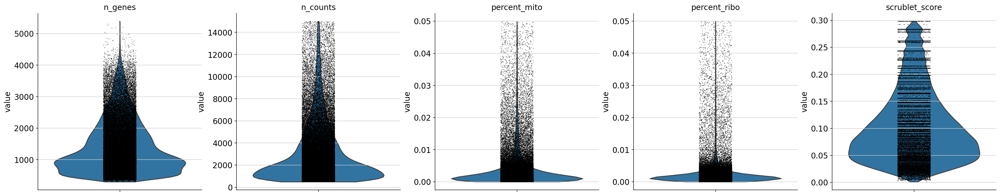

In [25]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito','percent_ribo', 'scrublet_score'],
             jitter=0.1, multi_panel=True)

## Filter for highly variable genes

In [26]:
sc.pp.highly_variable_genes(adata, flavor = 'seurat')
adata_hvg = adata[:, adata.var['highly_variable']]

In [27]:
sc.pp.regress_out(adata_hvg, ['n_counts', 'percent_mito'], n_jobs = 8)

## Scale gene counts from 0 (minimum expression) to 1 (maximum expression) per gene
- The ideal behind this is to allow for equal weighting for each gene irrespective if it is a highly or lowly expressed
- Some groups argue that the abundance of gene expression is biology and its effect shouldn't be taken out when clustering
- This is optional, you can try running it with and without scaling to see if it has any difference on your clustering

In [28]:
sc.pp.scale(adata_hvg, max_value = 10)

## Perform dimension reduction and create UMAP

In [29]:
sc.tl.pca(adata_hvg, svd_solver='arpack', random_state = 1786)

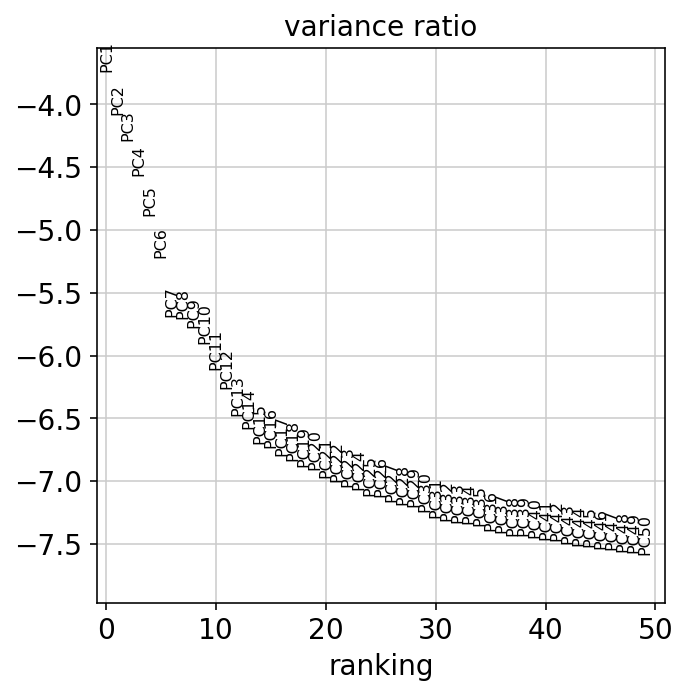

In [30]:
sc.pl.pca_variance_ratio(adata_hvg, n_pcs=50, log=True)

In [32]:
# Here we do batch correction using harmony, it modifies the PCA space. 
# If you don't have any batches to correct for then this is not necessary. eg. sequence multiple regions from a single heart, you wouldn't want to batch correct as you would lose regional differences
# Here I use the .obs field 'Sample' as the batch groups to correct for.

pca = adata_hvg.obsm['X_pca']
batch = adata_hvg.obs['Patient']
meta_data = adata_hvg.obs

ho = hm.run_harmony(pca, meta_data, ['Patient']
                    , random_state=1718, epsilon_harmony = -float('Inf'), max_iter_kmeans = 10, tau=100, lamb = 1)

res = pd.DataFrame(ho.Z_corr)
res=res.T
adata_hvg.obsm['X_pca'] = res.values

2022-03-02 11:55:34,015 - harmonypy - INFO - Iteration 1 of 10
2022-03-02 11:55:46,498 - harmonypy - INFO - Iteration 2 of 10
2022-03-02 11:55:59,006 - harmonypy - INFO - Iteration 3 of 10
2022-03-02 11:56:11,604 - harmonypy - INFO - Iteration 4 of 10
2022-03-02 11:56:24,011 - harmonypy - INFO - Iteration 5 of 10
2022-03-02 11:56:36,483 - harmonypy - INFO - Iteration 6 of 10
2022-03-02 11:56:48,901 - harmonypy - INFO - Iteration 7 of 10
2022-03-02 11:57:01,459 - harmonypy - INFO - Iteration 8 of 10
2022-03-02 11:57:10,787 - harmonypy - INFO - Iteration 9 of 10
2022-03-02 11:57:19,007 - harmonypy - INFO - Iteration 10 of 10
2022-03-02 11:57:27,166 - harmonypy - INFO - Stopped before convergence


In [34]:
sc.pp.neighbors(adata_hvg, random_state = 1786)

In [35]:
sc.tl.umap(adata_hvg, min_dist = 0.2, spread = 0.5, random_state = 1718)

Adipocyte


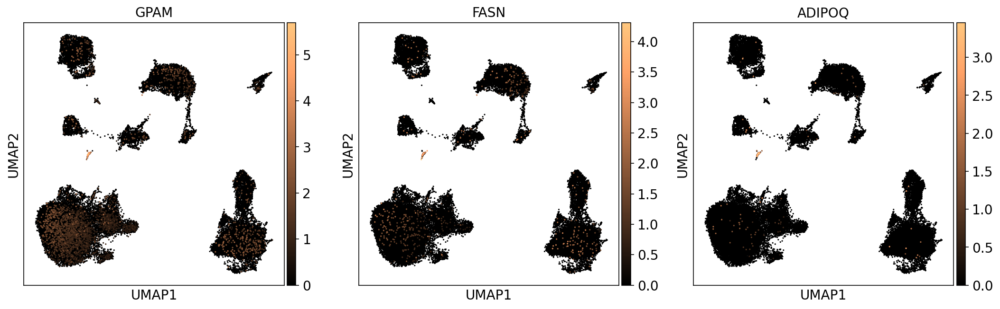

Atrial_Cardiomyocyte


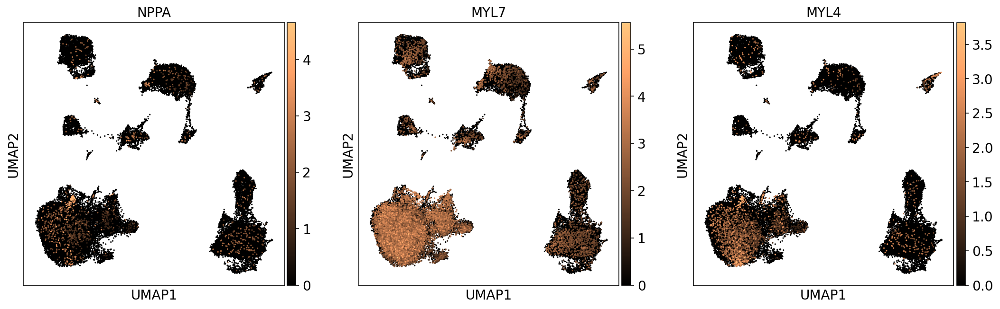

Endothelial


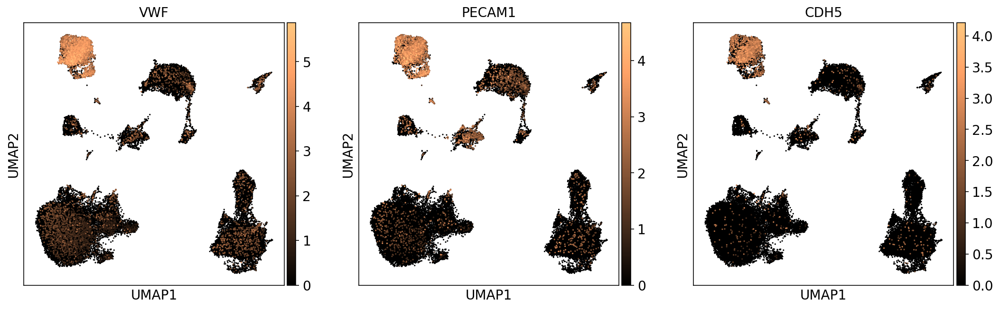

Fibroblast


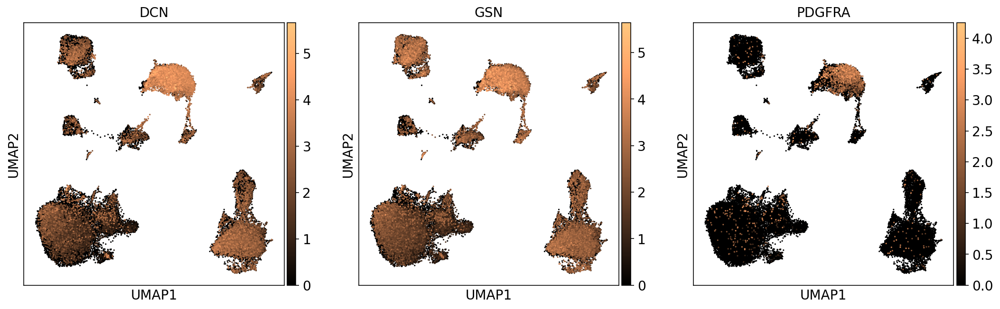

Lymphoid


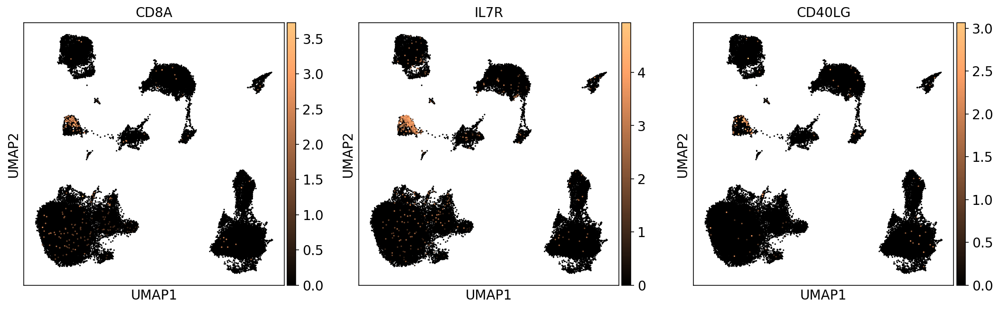

Mesothelial


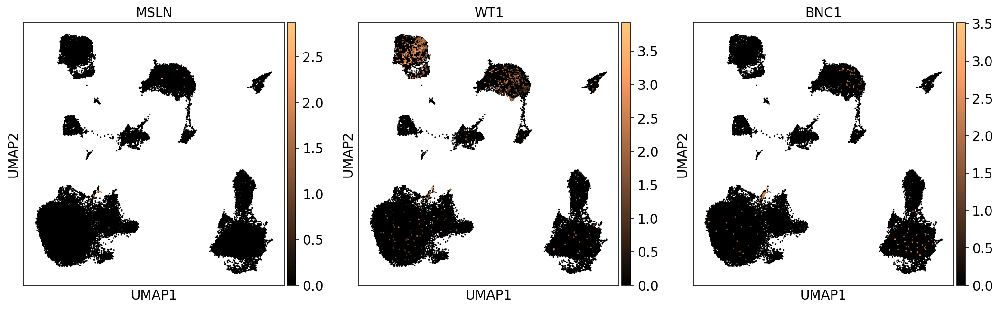

Myeloid


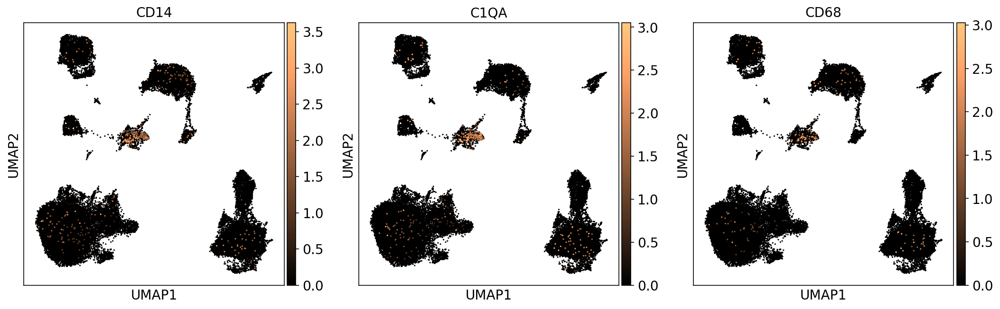

Neuronal


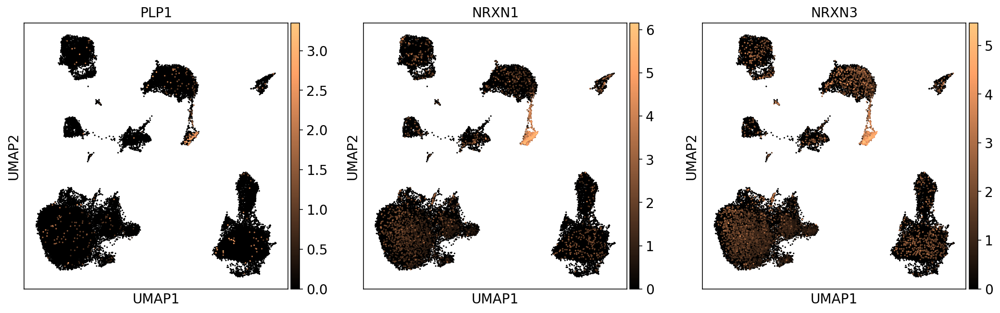

Pericytes


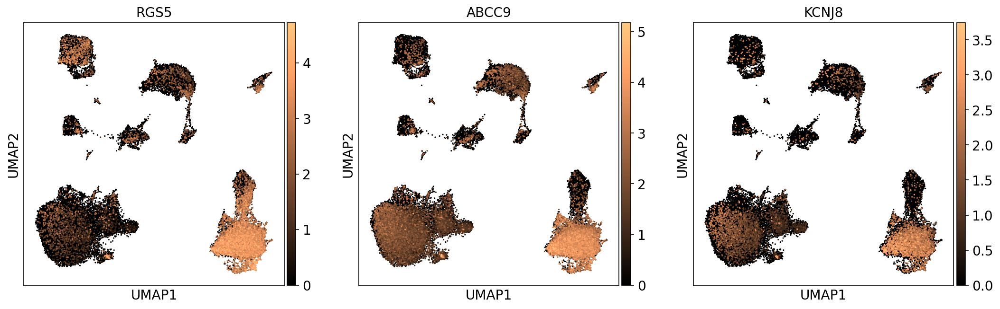

Smooth_muscle_cells


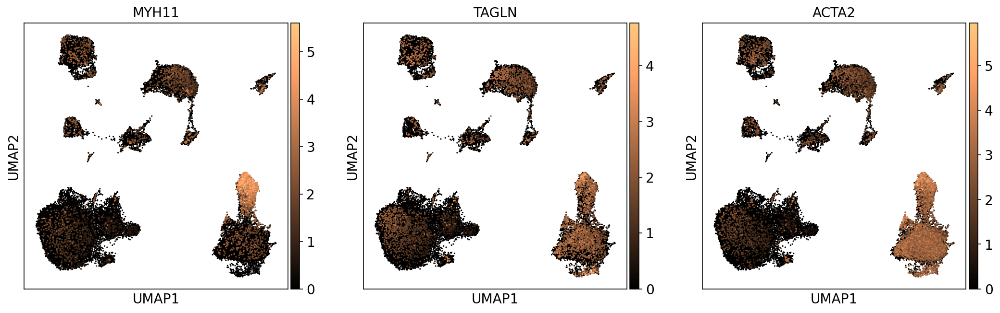

Ventricular_Cardiomyocytes


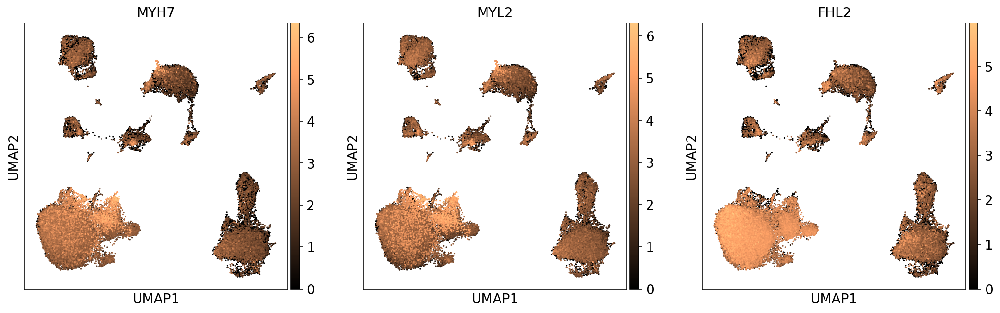

non-vasc_EC


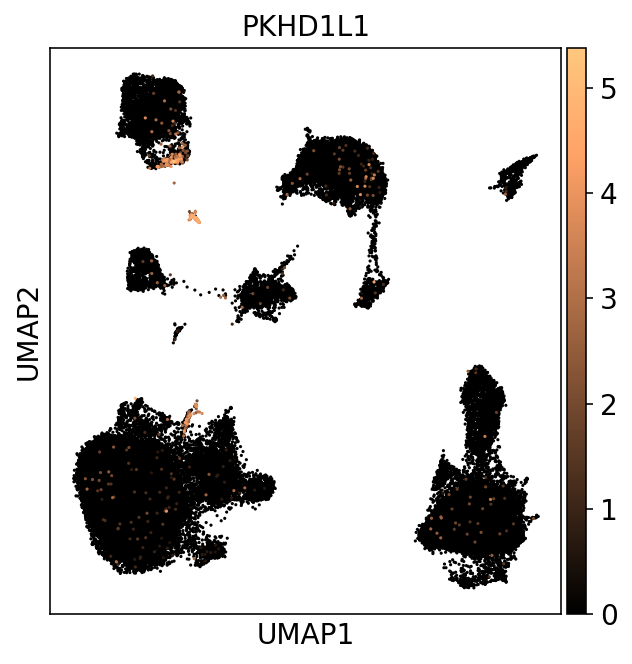

Mast


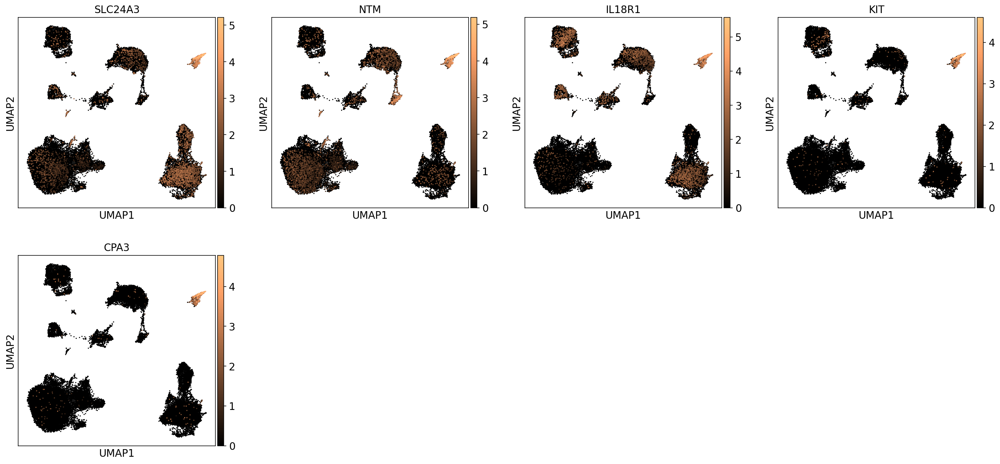

In [39]:
marker_genes_dict = {'Adipocyte': ['GPAM', 'FASN','ADIPOQ'],
                     'Atrial_Cardiomyocyte': ['NPPA', 'MYL7', 'MYL4'],
                     'Endothelial': ['VWF', 'PECAM1', 'CDH5'],
                     'Fibroblast': ['DCN', 'GSN', 'PDGFRA'],
                     'Lymphoid': ['CD8A', 'IL7R', 'CD40LG'],
                     'Mesothelial': ['MSLN', 'WT1', 'BNC1'],
                     'Myeloid': ['CD14', 'C1QA', 'CD68'],
                     'Neuronal': ['PLP1', 'NRXN1', 'NRXN3'],
                     'Pericytes': ['RGS5', 'ABCC9', 'KCNJ8' ],
                     'Smooth_muscle_cells': ['MYH11', 'TAGLN', 'ACTA2'],
                     'Ventricular_Cardiomyocytes': ['MYH7', 'MYL2', 'FHL2'],
                     'non-vasc_EC': ['PKHD1L1'],
                     'Mast': ['SLC24A3','NTM','IL18R1','KIT','CPA3']
                    }
for k in marker_genes_dict.keys():
    print(k)
    sc.pl.umap(adata_hvg, color = marker_genes_dict[k], size = 10, legend_fontsize = 12, 
               color_map = 
               #'PuOr'
               #'PuBuGn'
               #'bone'
               'copper'
               #'cividis'
               #'RdPu'
              )

## Run clustering using leiden
- Here I run a leiden using a number of different resolutions to find a clustering that I like
- You don't need to run so many, you can also use resolutions lower 0.1 if necessary or high as well

In [42]:
sc.tl.leiden(adata_hvg, resolution = 0.1, random_state = 1786, key_added = 'leiden_010')
sc.tl.leiden(adata_hvg, resolution = 0.11, random_state = 1786, key_added = 'leiden_011')
sc.tl.leiden(adata_hvg, resolution = 0.12, random_state = 1786, key_added = 'leiden_012')
sc.tl.leiden(adata_hvg, resolution = 0.13, random_state = 1786, key_added = 'leiden_013')
sc.tl.leiden(adata_hvg, resolution = 0.14, random_state = 1786, key_added = 'leiden_014')
sc.tl.leiden(adata_hvg, resolution = 0.15, random_state = 1786, key_added = 'leiden_015')
sc.tl.leiden(adata_hvg, resolution = 0.16, random_state = 1786, key_added = 'leiden_016')
sc.tl.leiden(adata_hvg, resolution = 0.17, random_state = 1786, key_added = 'leiden_017')
sc.tl.leiden(adata_hvg, resolution = 0.18, random_state = 1786, key_added = 'leiden_018')
sc.tl.leiden(adata_hvg, resolution = 0.19, random_state = 1786, key_added = 'leiden_019')

sc.tl.leiden(adata_hvg, resolution = 0.2, random_state = 1786, key_added = 'leiden_020')
sc.tl.leiden(adata_hvg, resolution = 0.21, random_state = 1786, key_added = 'leiden_021')
sc.tl.leiden(adata_hvg, resolution = 0.22, random_state = 1786, key_added = 'leiden_022')
sc.tl.leiden(adata_hvg, resolution = 0.23, random_state = 1786, key_added = 'leiden_023')
sc.tl.leiden(adata_hvg, resolution = 0.24, random_state = 1786, key_added = 'leiden_024')
sc.tl.leiden(adata_hvg, resolution = 0.25, random_state = 1786, key_added = 'leiden_025')
sc.tl.leiden(adata_hvg, resolution = 0.26, random_state = 1786, key_added = 'leiden_026')
sc.tl.leiden(adata_hvg, resolution = 0.27, random_state = 1786, key_added = 'leiden_027')
sc.tl.leiden(adata_hvg, resolution = 0.28, random_state = 1786, key_added = 'leiden_028')
sc.tl.leiden(adata_hvg, resolution = 0.29, random_state = 1786, key_added = 'leiden_029')

sc.tl.leiden(adata_hvg, resolution = 0.3, random_state = 1786, key_added = 'leiden_030')
sc.tl.leiden(adata_hvg, resolution = 0.31, random_state = 1786, key_added = 'leiden_031')
sc.tl.leiden(adata_hvg, resolution = 0.32, random_state = 1786, key_added = 'leiden_032')
sc.tl.leiden(adata_hvg, resolution = 0.33, random_state = 1786, key_added = 'leiden_033')
sc.tl.leiden(adata_hvg, resolution = 0.34, random_state = 1786, key_added = 'leiden_034')
sc.tl.leiden(adata_hvg, resolution = 0.35, random_state = 1786, key_added = 'leiden_035')
sc.tl.leiden(adata_hvg, resolution = 0.36, random_state = 1786, key_added = 'leiden_036')
sc.tl.leiden(adata_hvg, resolution = 0.37, random_state = 1786, key_added = 'leiden_037')
sc.tl.leiden(adata_hvg, resolution = 0.38, random_state = 1786, key_added = 'leiden_038')
sc.tl.leiden(adata_hvg, resolution = 0.39, random_state = 1786, key_added = 'leiden_039')

In [43]:
sc.tl.leiden(adata_hvg, resolution = 0.01, random_state = 1786, key_added = 'leiden_001')
sc.tl.leiden(adata_hvg, resolution = 0.02, random_state = 1786, key_added = 'leiden_002')
sc.tl.leiden(adata_hvg, resolution = 0.03, random_state = 1786, key_added = 'leiden_003')
sc.tl.leiden(adata_hvg, resolution = 0.04, random_state = 1786, key_added = 'leiden_004')
sc.tl.leiden(adata_hvg, resolution = 0.05, random_state = 1786, key_added = 'leiden_005')
sc.tl.leiden(adata_hvg, resolution = 0.06, random_state = 1786, key_added = 'leiden_006')
sc.tl.leiden(adata_hvg, resolution = 0.07, random_state = 1786, key_added = 'leiden_007')
sc.tl.leiden(adata_hvg, resolution = 0.08, random_state = 1786, key_added = 'leiden_008')
sc.tl.leiden(adata_hvg, resolution = 0.09, random_state = 1786, key_added = 'leiden_009')

In [44]:
sc.tl.leiden(adata_hvg, resolution = 0.1, random_state = 1786, key_added = 'leiden_010')
sc.tl.leiden(adata_hvg, resolution = 0.2, random_state = 1786, key_added = 'leiden_020')
sc.tl.leiden(adata_hvg, resolution = 0.3, random_state = 1786, key_added = 'leiden_030')
sc.tl.leiden(adata_hvg, resolution = 0.4, random_state = 1786, key_added = 'leiden_040')
sc.tl.leiden(adata_hvg, resolution = 0.5, random_state = 1786, key_added = 'leiden_050')
sc.tl.leiden(adata_hvg, resolution = 0.6, random_state = 1786, key_added = 'leiden_060')
sc.tl.leiden(adata_hvg, resolution = 0.7, random_state = 1786, key_added = 'leiden_070')
sc.tl.leiden(adata_hvg, resolution = 0.8, random_state = 1786, key_added = 'leiden_080')
sc.tl.leiden(adata_hvg, resolution = 0.9, random_state = 1786, key_added = 'leiden_090')

In [ ]:
sc.tl.leiden(adata_hvg, resolution = 0.1, random_state = 1786, key_added = 'leiden_100')
sc.tl.leiden(adata_hvg, resolution = 0.2, random_state = 1786, key_added = 'leiden_200')
sc.tl.leiden(adata_hvg, resolution = 0.3, random_state = 1786, key_added = 'leiden_300')
sc.tl.leiden(adata_hvg, resolution = 0.4, random_state = 1786, key_added = 'leiden_400')
sc.tl.leiden(adata_hvg, resolution = 0.5, random_state = 1786, key_added = 'leiden_500')
sc.tl.leiden(adata_hvg, resolution = 0.6, random_state = 1786, key_added = 'leiden_600')
sc.tl.leiden(adata_hvg, resolution = 0.7, random_state = 1786, key_added = 'leiden_700')
sc.tl.leiden(adata_hvg, resolution = 0.8, random_state = 1786, key_added = 'leiden_800')
sc.tl.leiden(adata_hvg, resolution = 0.9, random_state = 1786, key_added = 'leiden_900')

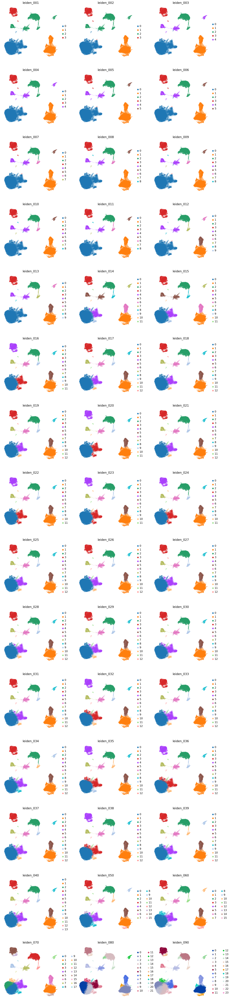

In [45]:
sc.pl.umap(adata_hvg, color = sorted(adata_hvg.obs.columns[adata_hvg.obs.columns.str.startswith('leiden_')].tolist())
           , size = 6, legend_fontsize = 12, frameon = False, ncols=3)

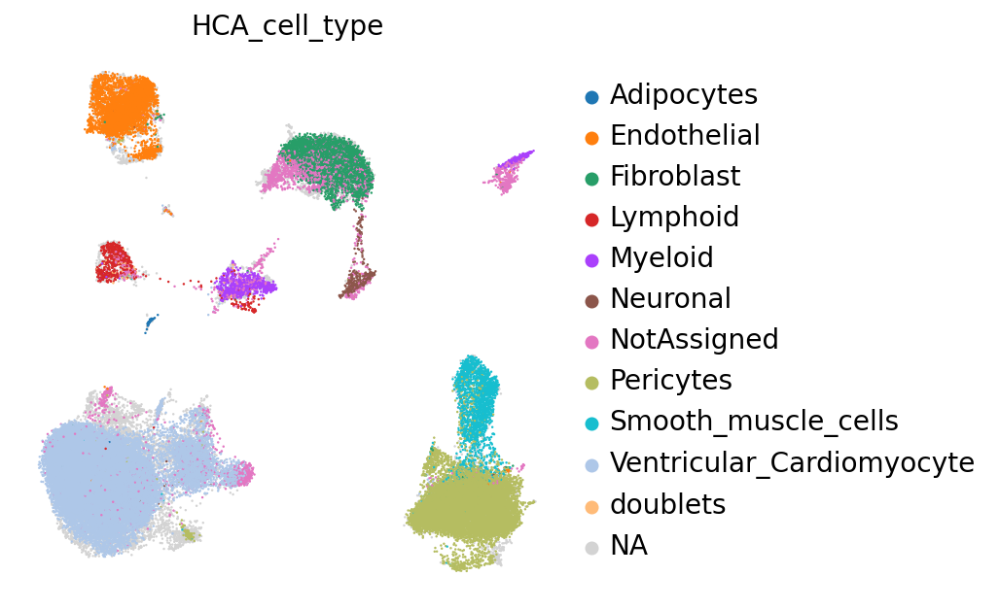

In [46]:
sc.pl.umap(adata_hvg, color = ['HCA_cell_type'
                              ], size = 6, legend_fontsize = 14, frameon = False, ncols=1)

Pick the leiden resolution that you like the best to move forward with the analysis. You can always come back and investigate another resolution if you think there are too few or too many clusters

In [47]:
#adata_hvg.obs['leiden'] = adata_hvg.obs.leiden_013
adata_hvg.obs['leiden'] = adata_hvg.obs.leiden_018

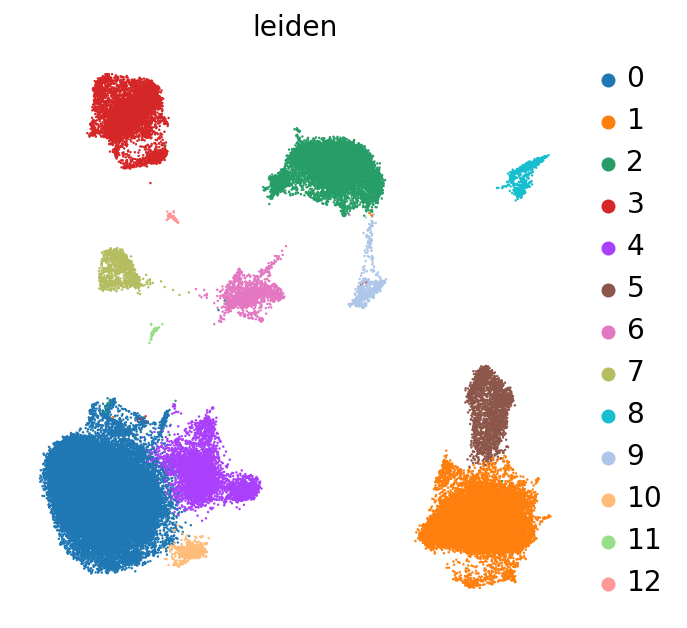

In [48]:
sc.pl.umap(adata_hvg, color = ['leiden'
                              ], size = 6, legend_fontsize = 14, frameon = False, ncols=1)

In [49]:
# Crosstabs is a handy function for counting how many cells across .obs
pd.crosstab(adata_hvg.obs.Group, adata_hvg.obs.leiden)

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12
Group,,,,,,,,,,,,,
control,22406,12307,5215,4173,4013,1945,1161,753,769,636,117,40,24
IHD,3713,1193,2307,1346,943,334,348,345,16,85,444,93,100


## Calling DEGs for each of the leiden clusters

In [51]:
sc.tl.rank_genes_groups(adata_hvg, 'leiden'
                        , method = 'wilcoxon', use_raw = True)

In [52]:
markers_nuclei = DEG_table(adata_hvg)
markers_nuclei.head(10)

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,...,9_l,10_n,10_p,10_l,11_n,11_p,11_l,12_n,12_p,12_l
0,TTN,0.0,3.822273,DLC1,0.0,4.311145,NEGR1,0.0,6.564044,VWF,...,9.475367,AC010680.1,7.327462e-187,5.529705,ACACB,7.190522e-69,4.755335,PKHD1L1,4.874257e-63,10.997850
1,RYR2,0.0,4.000392,FRMD3,0.0,4.925917,ABCA6,0.0,6.327662,ST6GALNAC3,...,7.657331,TNNI3K,6.360191e-185,5.088201,MGST1,5.506739e-63,5.720264,MMRN1,1.367707e-54,11.299335
2,MYBPC3,0.0,3.830418,EPS8,0.0,4.852776,DCN,0.0,4.607590,LDB2,...,5.942656,AC092353.1,4.494502e-184,5.265815,GPAM,5.353421e-62,7.526572,DOCK5,1.363553e-52,4.209883
3,MLIP,0.0,3.831992,PDGFRB,0.0,5.216218,ABCA8,0.0,5.078019,ANO2,...,9.089714,AC010680.5,2.012039e-183,5.452481,PLIN1,2.327423e-60,10.235844,PPFIBP1,3.560768e-49,3.099272
4,FGF12,0.0,3.795425,PLA2G5,0.0,4.567452,CDH19,0.0,6.374513,PTPRB,...,6.572134,LINC02208,1.468034e-160,4.267289,PPARG,3.150059e-60,5.214423,TFPI,8.832725e-48,4.375253
5,SGCD,0.0,3.712448,EGFLAM,0.0,6.198493,PID1,0.0,5.625656,BTNL9,...,3.618282,AL355612.1,2.342026e-156,4.717593,PDE3B,5.049739e-59,5.394526,STOX2,1.867348e-47,4.588244
6,SORBS2,0.0,3.460489,GUCY1A2,0.0,5.889985,ACSM3,0.0,6.422861,EGFL7,...,4.609448,AC002463.1,8.644613e-152,4.012693,TMEM132C,4.625267e-58,6.086994,ST6GALNAC3,3.964611e-47,5.262809
7,SLC8A1,0.0,3.105190,NR2F2-AS1,0.0,4.940118,LAMA2,0.0,2.749727,ELMO1,...,3.652752,KCNMB2,8.644613e-152,4.286943,SOX5,9.199774e-57,4.150521,VAV3,8.538913e-46,5.994569
8,TTN-AS1,0.0,3.834219,CARMN,0.0,4.311339,SCN7A,0.0,4.555852,TACC1,...,3.736083,FNIP1,7.250146e-150,3.834802,EBF1,6.829334e-55,4.394085,GPM6A,5.292727e-45,6.543743
9,LDB3,0.0,3.230385,SOX5,0.0,3.705497,BICC1,0.0,6.141533,MECOM,...,3.557340,AC108472.1,6.565771e-145,3.389807,ACSL1,7.953901e-54,4.402525,FRMD4B,1.154416e-44,4.166339


In [53]:
sc.tl.dendrogram(adata_hvg, groupby='leiden')

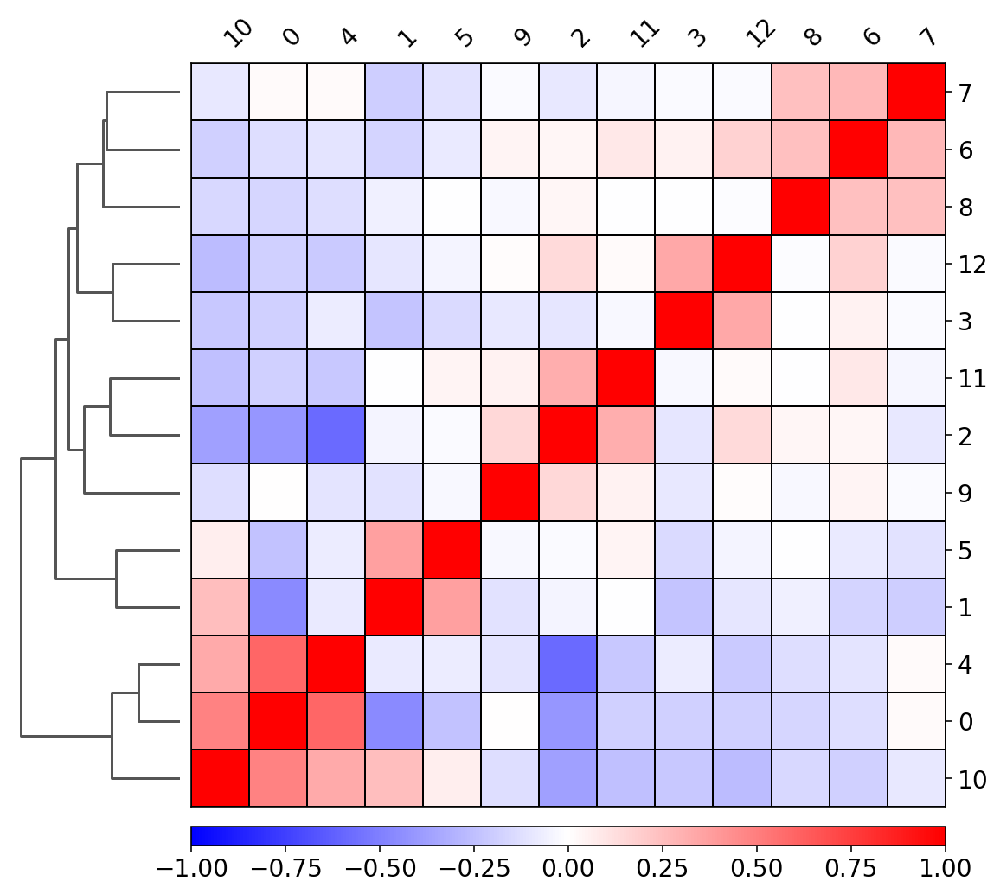

In [54]:
sc.pl.correlation_matrix(adata_hvg, groupby='leiden')

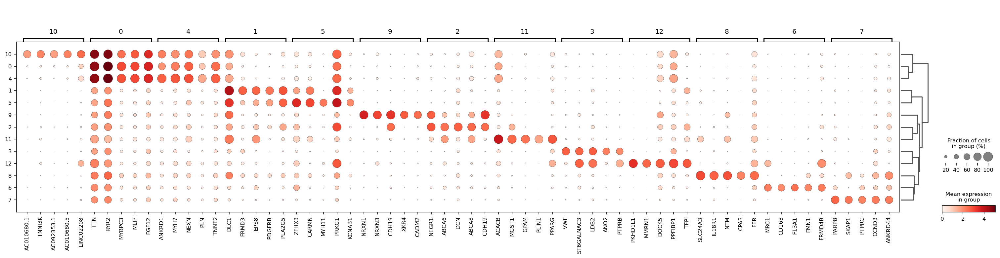

In [55]:
sc.pl.rank_genes_groups_dotplot(adata_hvg, key='rank_genes_groups', n_genes=5
                                ,use_raw=True
                                #,mean_only_expressed = True
                                #,save='_DEGs_hca_heart_global_ctl200422_wilcox.pdf'
)

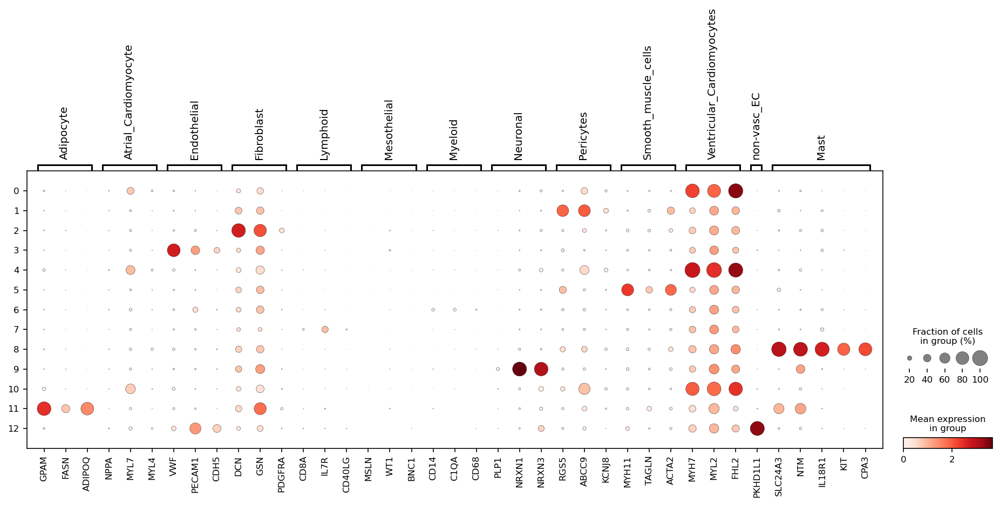

In [56]:
marker_genes_dict = {'Adipocyte': ['GPAM', 'FASN','ADIPOQ'],
                     'Atrial_Cardiomyocyte': ['NPPA', 'MYL7', 'MYL4'],
                     'Endothelial': ['VWF', 'PECAM1', 'CDH5'],
                     'Fibroblast': ['DCN', 'GSN', 'PDGFRA'],
                     'Lymphoid': ['CD8A', 'IL7R', 'CD40LG'],
                     'Mesothelial': ['MSLN', 'WT1', 'BNC1'],
                     'Myeloid': ['CD14', 'C1QA', 'CD68'],
                     'Neuronal': ['PLP1', 'NRXN1', 'NRXN3'],
                     'Pericytes': ['RGS5', 'ABCC9', 'KCNJ8' ],
                     'Smooth_muscle_cells': ['MYH11', 'TAGLN', 'ACTA2'],
                     'Ventricular_Cardiomyocytes': ['MYH7', 'MYL2', 'FHL2'],
                     'non-vasc_EC': ['PKHD1L1'],
                     'Mast': ['SLC24A3','NTM','IL18R1','KIT','CPA3']
                    }
sc.pl.dotplot(adata_hvg, var_names=marker_genes_dict, groupby='leiden'
                    ,use_raw=True
             )

### Filter DEG lists by q-value and logFC

In [61]:
filtered_markers_nuclei = filtered_DEGs(adata_hvg, q_value = 1E-5, fold_change = 1)

In [62]:
filtered_markers_nuclei.head(20)

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,...,9_l,10_n,10_p,10_l,11_n,11_p,11_l,12_n,12_p,12_l
0,TTN,0.0,3.822273,DLC1,0.0,4.311145,NEGR1,0.0,6.564044,VWF,...,9.475367,AC010680.1,7.327462e-187,5.529705,ACACB,7.190522e-69,4.755335,PKHD1L1,4.874257e-63,10.997850
1,RYR2,0.0,4.000392,FRMD3,0.0,4.925917,ABCA6,0.0,6.327662,ST6GALNAC3,...,7.657331,TNNI3K,6.360191e-185,5.088201,MGST1,5.506739e-63,5.720264,MMRN1,1.367707e-54,11.299335
2,MYBPC3,0.0,3.830418,EPS8,0.0,4.852776,DCN,0.0,4.607590,LDB2,...,5.942656,AC092353.1,4.494502e-184,5.265815,GPAM,5.353421e-62,7.526572,DOCK5,1.363553e-52,4.209883
3,MLIP,0.0,3.831992,PDGFRB,0.0,5.216218,ABCA8,0.0,5.078019,ANO2,...,9.089714,AC010680.5,2.012039e-183,5.452481,PLIN1,2.327423e-60,10.235844,PPFIBP1,3.560768e-49,3.099272
4,FGF12,0.0,3.795425,PLA2G5,0.0,4.567452,CDH19,0.0,6.374513,PTPRB,...,6.572134,LINC02208,1.468034e-160,4.267289,PPARG,3.150059e-60,5.214423,TFPI,8.832725e-48,4.375253
5,SGCD,0.0,3.712448,EGFLAM,0.0,6.198493,PID1,0.0,5.625656,BTNL9,...,3.618282,AL355612.1,2.342026e-156,4.717593,PDE3B,5.049739e-59,5.394526,STOX2,1.867348e-47,4.588244
6,SORBS2,0.0,3.460489,GUCY1A2,0.0,5.889985,ACSM3,0.0,6.422861,EGFL7,...,4.609448,AC002463.1,8.644613e-152,4.012693,TMEM132C,4.625267e-58,6.086994,ST6GALNAC3,3.964611e-47,5.262809
7,SLC8A1,0.0,3.105190,NR2F2-AS1,0.0,4.940118,LAMA2,0.0,2.749727,ELMO1,...,3.652752,KCNMB2,8.644613e-152,4.286943,SOX5,9.199774e-57,4.150521,VAV3,8.538913e-46,5.994569
8,TTN-AS1,0.0,3.834219,CARMN,0.0,4.311339,SCN7A,0.0,4.555852,TACC1,...,3.736083,FNIP1,7.250146e-150,3.834802,EBF1,6.829334e-55,4.394085,GPM6A,5.292727e-45,6.543743
9,LDB3,0.0,3.230385,SOX5,0.0,3.705497,BICC1,0.0,6.141533,MECOM,...,3.557340,AC108472.1,6.565771e-145,3.389807,ACSL1,7.953901e-54,4.402525,FRMD4B,1.154416e-44,4.166339


In [63]:
filtered_markers_names_nuclei = filtered_DEG_names(adata_hvg, q_value = 1E-5, fold_change = 1)
filtered_markers_names_nuclei.head(20)

,0_n,1_n,2_n,3_n,4_n,5_n,6_n,7_n,8_n,9_n,10_n,11_n,12_n
0,TTN,DLC1,NEGR1,VWF,ANKRD1,ZFHX3,MRC1,PARP8,SLC24A3,NRXN1,AC010680.1,ACACB,PKHD1L1
1,RYR2,FRMD3,ABCA6,ST6GALNAC3,MYH7,CARMN,CD163,SKAP1,IL18R1,NRXN3,TNNI3K,MGST1,MMRN1
2,MYBPC3,EPS8,DCN,LDB2,NEXN,MYH11,F13A1,PTPRC,NTM,CDH19,AC092353.1,GPAM,DOCK5
3,MLIP,PDGFRB,ABCA8,ANO2,PLN,PRKG1,FMN1,CCND3,CPA3,XKR4,AC010680.5,PLIN1,PPFIBP1
4,FGF12,PLA2G5,CDH19,PTPRB,TNNT2,KCNAB1,FRMD4B,ANKRD44,FER,CADM2,LINC02208,PPARG,TFPI
5,SGCD,EGFLAM,PID1,BTNL9,CSRP3,ACTA2,RBM47,ARHGAP15,KIT,ANK3,AL355612.1,PDE3B,STOX2
6,SORBS2,GUCY1A2,ACSM3,EGFL7,FABP3,SLIT3,RBPJ,PIP4K2A,KIAA1549,NEGR1,AC002463.1,TMEM132C,ST6GALNAC3
7,SLC8A1,NR2F2-AS1,LAMA2,ELMO1,HSPB7,PLA2G5,TBXAS1,IKZF1,CDK15,SCN7A,KCNMB2,SOX5,VAV3
8,TTN-AS1,CARMN,SCN7A,TACC1,ACTN2,NTRK3,SLC9A9,FYN,AC092979.1,EHBP1,FNIP1,EBF1,GPM6A
9,LDB3,SOX5,BICC1,MECOM,DES,CARMIL1,MS4A6A,IQGAP2,LRMDA,ADGRB3,AC108472.1,ACSL1,FRMD4B


- Write the DEGs to a .csv file to look over

In [64]:
filtered_markers_nuclei.to_csv(OUTDIR + '/global_regressout_wilcox.csv', sep = ',', index = False)
filtered_markers_names_nuclei.transpose().to_csv(OUTDIR + '/global_regressout_wilcox_names.csv', sep = ',', index = True, header=False)

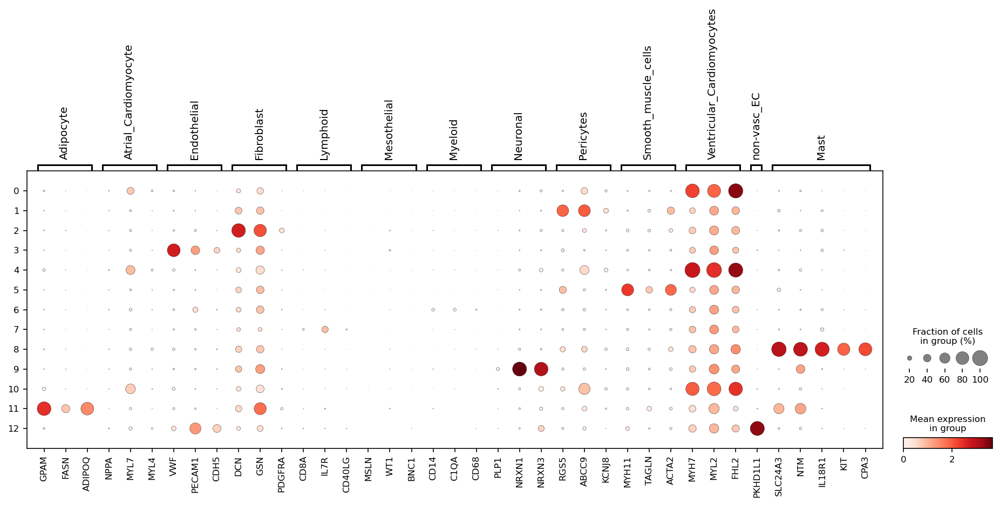

In [65]:
marker_genes_dict = {'Adipocyte': ['GPAM', 'FASN','ADIPOQ'],
                     'Atrial_Cardiomyocyte': ['NPPA', 'MYL7', 'MYL4'],
                     'Endothelial': ['VWF', 'PECAM1', 'CDH5'],
                     'Fibroblast': ['DCN', 'GSN', 'PDGFRA'],
                     'Lymphoid': ['CD8A', 'IL7R', 'CD40LG'],
                     'Mesothelial': ['MSLN', 'WT1', 'BNC1'],
                     'Myeloid': ['CD14', 'C1QA', 'CD68'],
                     'Neuronal': ['PLP1', 'NRXN1', 'NRXN3'],
                     'Pericytes': ['RGS5', 'ABCC9', 'KCNJ8' ],
                     'Smooth_muscle_cells': ['MYH11', 'TAGLN', 'ACTA2'],
                     'Ventricular_Cardiomyocytes': ['MYH7', 'MYL2', 'FHL2'],
                     'non-vasc_EC': ['PKHD1L1'],
                     'Mast': ['SLC24A3','NTM','IL18R1','KIT','CPA3']
                    }

sc.pl.dotplot(adata_hvg, var_names=marker_genes_dict, groupby='leiden'
                ,use_raw=True
)

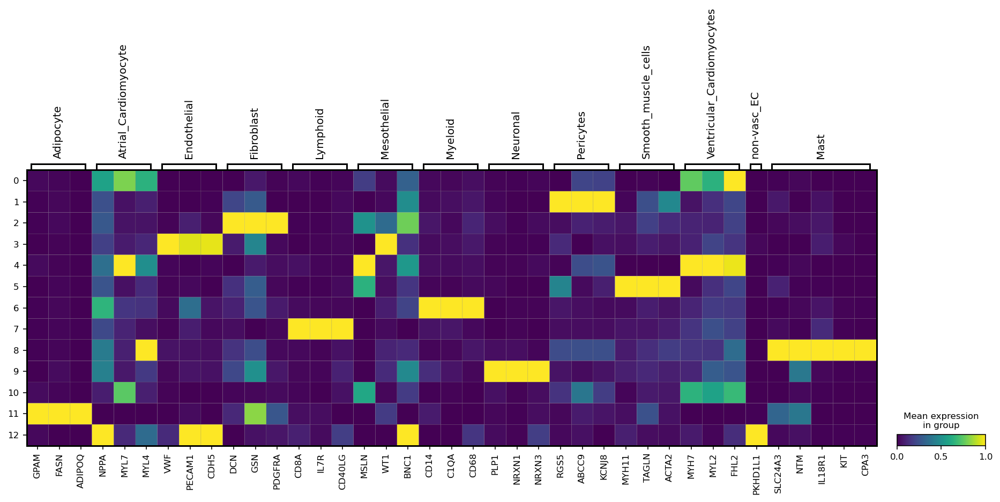

In [66]:
marker_genes_dict = {'Adipocyte': ['GPAM', 'FASN','ADIPOQ'],
                     'Atrial_Cardiomyocyte': ['NPPA', 'MYL7', 'MYL4'],
                     'Endothelial': ['VWF', 'PECAM1', 'CDH5'],
                     'Fibroblast': ['DCN', 'GSN', 'PDGFRA'],
                     'Lymphoid': ['CD8A', 'IL7R', 'CD40LG'],
                     'Mesothelial': ['MSLN', 'WT1', 'BNC1'],
                     'Myeloid': ['CD14', 'C1QA', 'CD68'],
                     'Neuronal': ['PLP1', 'NRXN1', 'NRXN3'],
                     'Pericytes': ['RGS5', 'ABCC9', 'KCNJ8' ],
                     'Smooth_muscle_cells': ['MYH11', 'TAGLN', 'ACTA2'],
                     'Ventricular_Cardiomyocytes': ['MYH7', 'MYL2', 'FHL2'],
                     'non-vasc_EC': ['PKHD1L1'],
                     'Mast': ['SLC24A3','NTM','IL18R1','KIT','CPA3']}

sc.pl.matrixplot(adata_hvg, var_names=marker_genes_dict, groupby='leiden'
                 ,standard_scale = 'var'
                ,use_raw=True
)

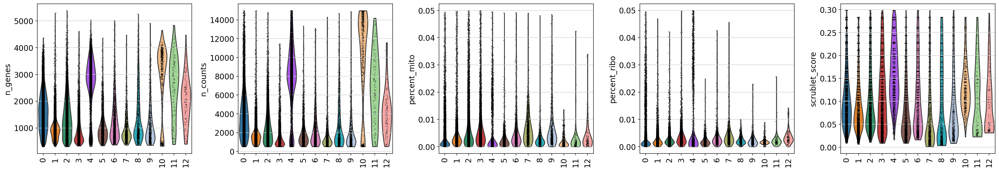

In [72]:
sc.pl.violin(adata_hvg, ['n_genes', 'n_counts', 'percent_mito','percent_ribo', 'scrublet_score'], groupby = 'leiden',
             jitter=0.1, multi_panel=True, rotation = 90)

## Annotating the clusters with meaningful names

In [73]:
adata_hvg.obs['cell_type'] = adata_hvg.obs['leiden'].astype(str)
old_names = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11','12']
new_names = ['vCM1','PC','FB','EC','vCM2','SMC','Myeloid','Lymphoid','Mast','Neuronal','vCM3','AD','non-Vascular_EC']
adata_hvg.obs['cell_type'] = adata_hvg.obs['cell_type'].map(dict(zip(old_names, new_names))).astype('category')

In [75]:
adata_hvg.obs['cell_type'].cat.categories

Index(['AD', 'EC', 'FB', 'Lymphoid', 'Mast', 'Myeloid', 'Neuronal', 'PC',
       'SMC', 'non-Vascular_EC', 'vCM1', 'vCM2', 'vCM3'],
      dtype='object')

In [103]:
adata_hvg.obs['cell_type2'] = adata_hvg.obs['leiden'].astype(str)
old_names = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11','12']
new_names = ['vCM','PC','FB','EC','vCM','SMC','Myeloid','Lymphoid','Myeloid','Neuronal','vCM','AD','EC']
adata_hvg.obs['cell_type2'] = adata_hvg.obs['cell_type2'].map(dict(zip(old_names, new_names))).astype('category')

In [104]:
adata_hvg.obs['cell_type2'].cat.categories

Index(['AD', 'EC', 'FB', 'Lymphoid', 'Myeloid', 'Neuronal', 'PC', 'SMC',
       'vCM'],
      dtype='object')

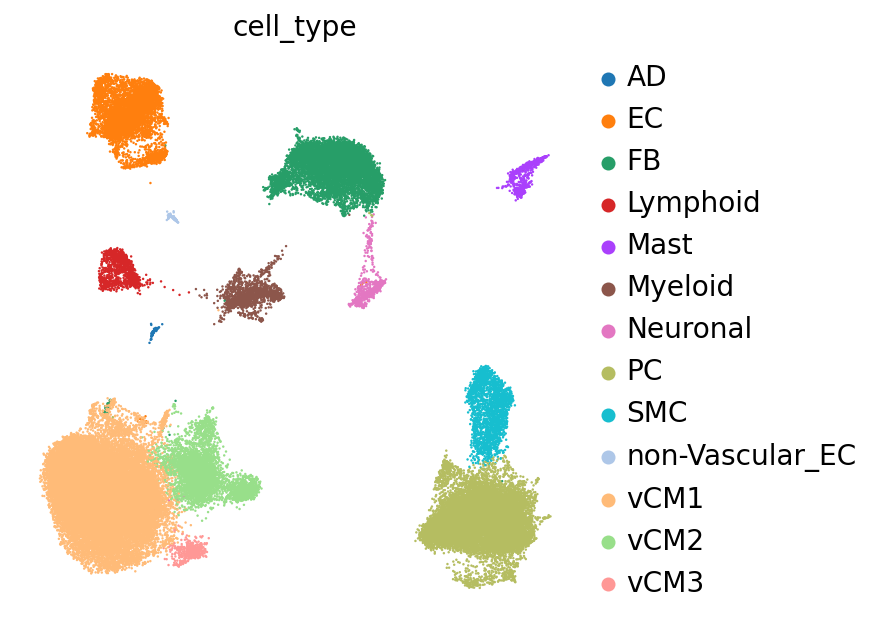

In [78]:
sc.pl.umap(adata_hvg, color = ['cell_type'
                              ], size = 6, legend_fontsize = 14, frameon = False, ncols=1)

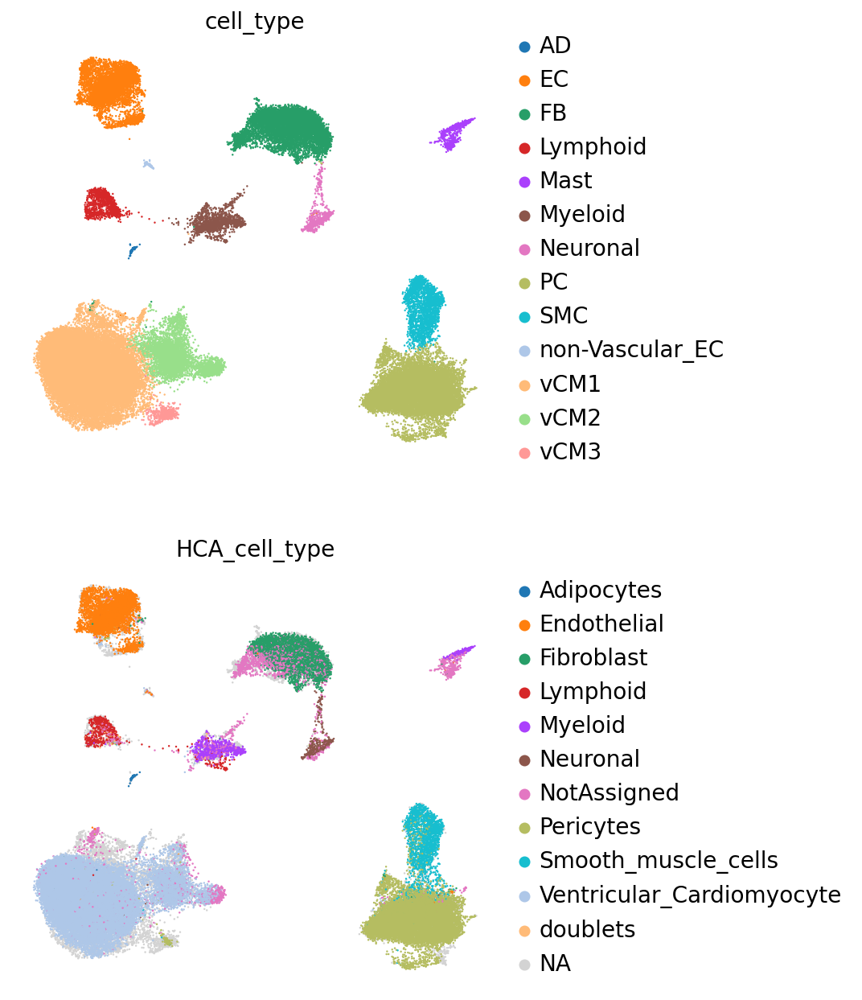

In [79]:
sc.pl.umap(adata_hvg, color = ['cell_type', 'HCA_cell_type'
                              ], size = 6, legend_fontsize = 14, frameon = False, ncols=1)

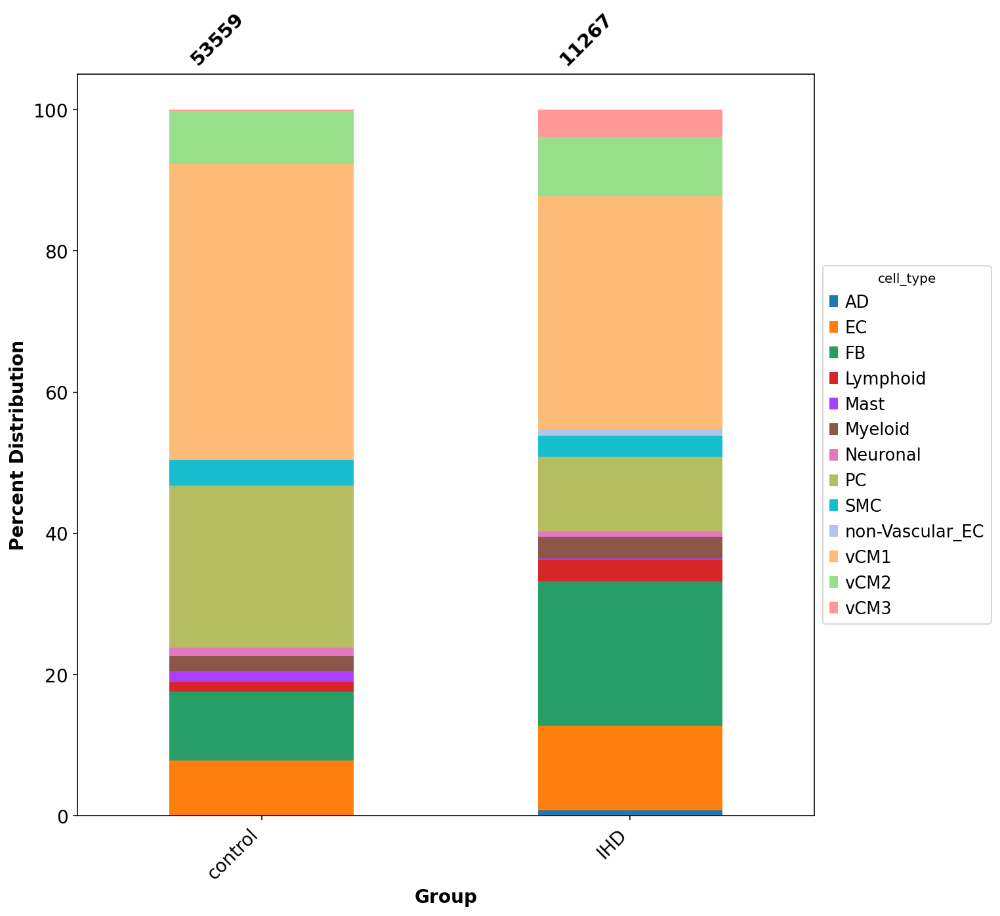

In [80]:
stacked_barplot(adata_hvg, 'Group', 'cell_type', 'Group', 'cell_type', shift_top=0.2, xaxis_rotation=45, figsize=(10,10), percent=False, save=None)

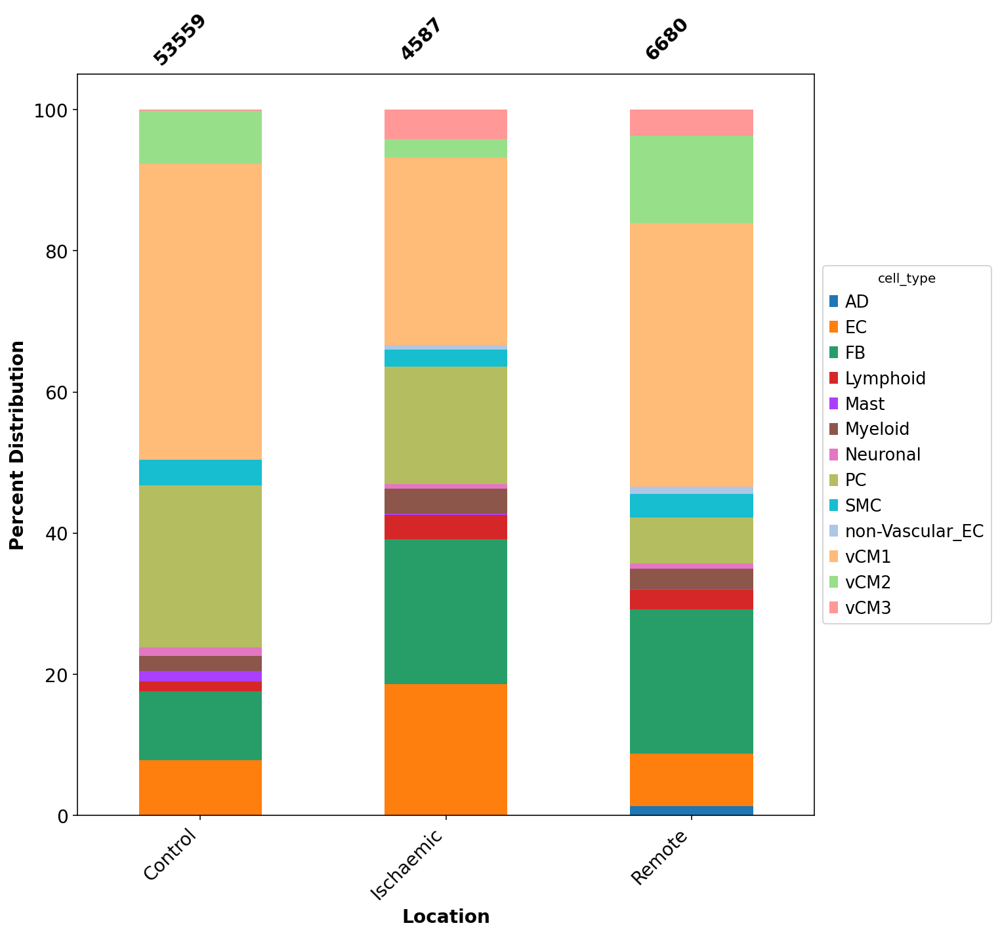

In [83]:
stacked_barplot(adata_hvg, 'Location', 'cell_type','Location', 'cell_type', shift_top=0.2, xaxis_rotation=45, figsize=(10,10), percent=False, save=None)

In [84]:
adata_hvg.obs['Patient_location'] = adata_hvg.obs.Patient.astype(str) + '_' + adata_hvg.obs.Location.astype(str)

## Save clustered and annotated object to a new .h5ad file
- I replace the .raw counts matrix with the original raw counts instead of saving the normalised, log transformed counts.
- This is prefered as you wont be able to recreate the raw counts from the normalised, log transformed counts should you ever want to.

In [105]:
adata_out = adata_hvg.copy()
adata_out.raw = adata_orig.copy()
adata_out.write(OUTDIR + '/CABG_regressout_ANNOTATED_' + DATE + '_inner.h5ad')

In [106]:
'/CABG_regressout_ANNOTATED_' + DATE + '_inner.h5ad'

'/CABG_regressout_ANNOTATED_2022-02-23_inner.h5ad'

In [88]:
print(adata_out.X.max())
print(adata_out.raw.X.max())

10.0
7993.0


In [89]:
adata_out.raw.var.shape

(32732, 6)

In [90]:
adata_out.var.shape

(4324, 12)

/home/mlee/anaconda3/envs/scanpy1.8.2/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Patient_location' as categorical


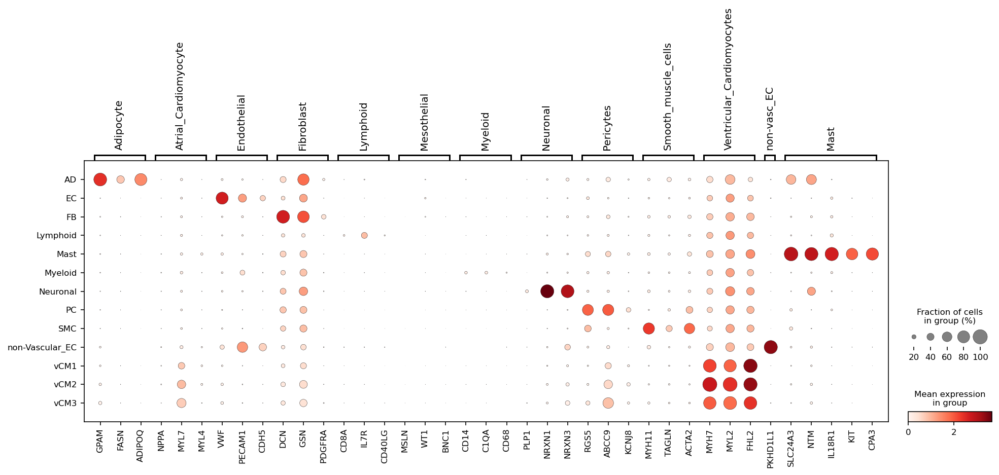

In [92]:
sc.pl.dotplot(adata_hvg, var_names=marker_genes_dict, groupby='cell_type'
                    ,use_raw=True
    )

In [101]:
adata_hvg.var.head()

,gene_ids,gene_name_IC,feature_type-0,gene_name_HCA,feature_types-1,feature_type,highly_variable,means,dispersions,dispersions_norm,mean,std
gene_name,,,,,,,,,,,,
AL645608.7,ENSG00000272512,AL645608.7,Gene Expression,AL645608.8,Gene Expression,Gene Expression,True,0.036576,2.105744,0.530537,2.302446e-11,0.148274
HES4,ENSG00000188290,HES4,Gene Expression,HES4,Gene Expression,Gene Expression,True,0.819116,2.458763,0.920992,5.390372e-11,0.761418
AGRN,ENSG00000188157,AGRN,Gene Expression,AGRN,Gene Expression,Gene Expression,True,0.034041,2.196001,0.740106,-1.816554e-11,0.141335
TNFRSF4,ENSG00000186827,TNFRSF4,Gene Expression,TNFRSF4,Gene Expression,Gene Expression,True,0.026286,2.385574,1.180279,-5.651786e-12,0.122033
VWA1,ENSG00000179403,VWA1,Gene Expression,VWA1,Gene Expression,Gene Expression,True,0.033523,2.248004,0.860854,7.152453e-13,0.139695


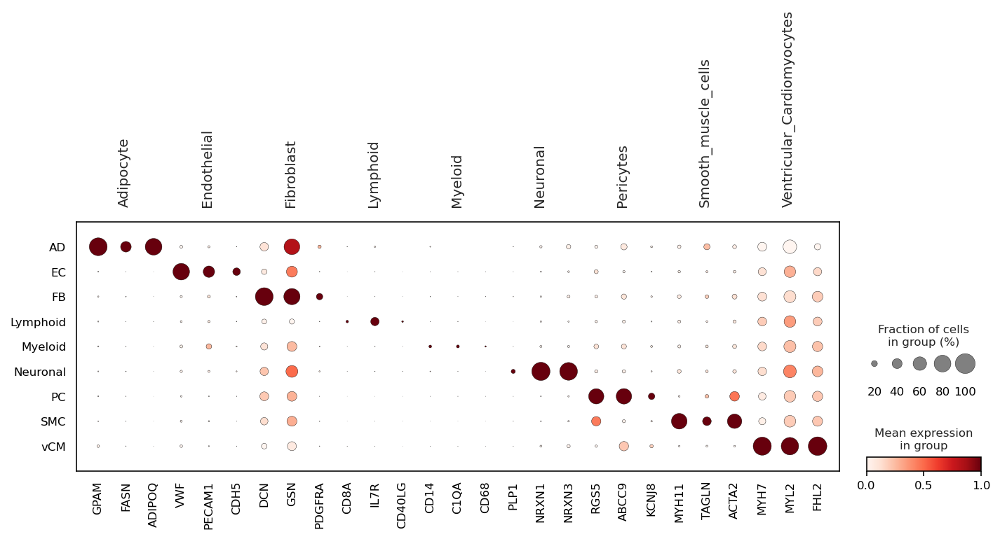

In [126]:
marker_genes_dict = {'Adipocyte': ['GPAM', 'FASN','ADIPOQ'],
                     'Endothelial': ['VWF', 'PECAM1', 'CDH5'],
                     'Fibroblast': ['DCN', 'GSN', 'PDGFRA'],
                     'Lymphoid': ['CD8A', 'IL7R', 'CD40LG'],
                     'Myeloid': ['CD14', 'C1QA', 'CD68'],
                     'Neuronal': ['PLP1', 'NRXN1', 'NRXN3'],
                     'Pericytes': ['RGS5', 'ABCC9', 'KCNJ8' ],
                     'Smooth_muscle_cells': ['MYH11', 'TAGLN', 'ACTA2'],
                     'Ventricular_Cardiomyocytes': ['MYH7', 'MYL2', 'FHL2']
                    }
sc.pl.dotplot(adata_hvg, var_names=marker_genes_dict, groupby='cell_type2'
                    ,use_raw=True
              ,standard_scale='var'
              ,save='_celltype2_HCA_markers_scaled.pdf'
             )

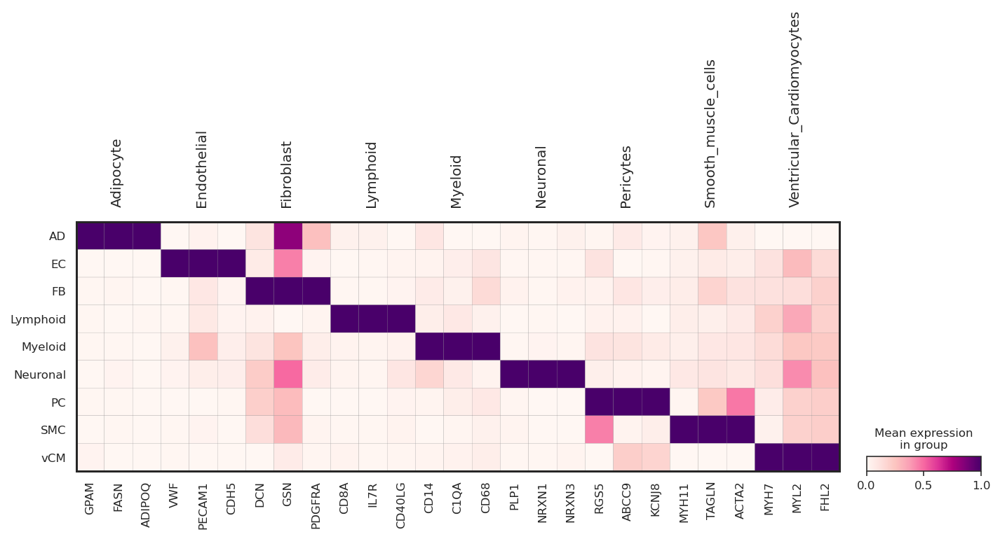

In [130]:
marker_genes_dict = {'Adipocyte': ['GPAM', 'FASN','ADIPOQ'],
                     'Endothelial': ['VWF', 'PECAM1', 'CDH5'],
                     'Fibroblast': ['DCN', 'GSN', 'PDGFRA'],
                     'Lymphoid': ['CD8A', 'IL7R', 'CD40LG'],
                     'Myeloid': ['CD14', 'C1QA', 'CD68'],
                     'Neuronal': ['PLP1', 'NRXN1', 'NRXN3'],
                     'Pericytes': ['RGS5', 'ABCC9', 'KCNJ8' ],
                     'Smooth_muscle_cells': ['MYH11', 'TAGLN', 'ACTA2'],
                     'Ventricular_Cardiomyocytes': ['MYH7', 'MYL2', 'FHL2']
                    }

sc.pl.matrixplot(adata_hvg, var_names=marker_genes_dict, groupby='cell_type2'
                 ,standard_scale = 'var'
                , use_raw=True
                ,save='_celltype2_HCA_markers_scaled.pdf'
                 ,cmap='RdPu'
)

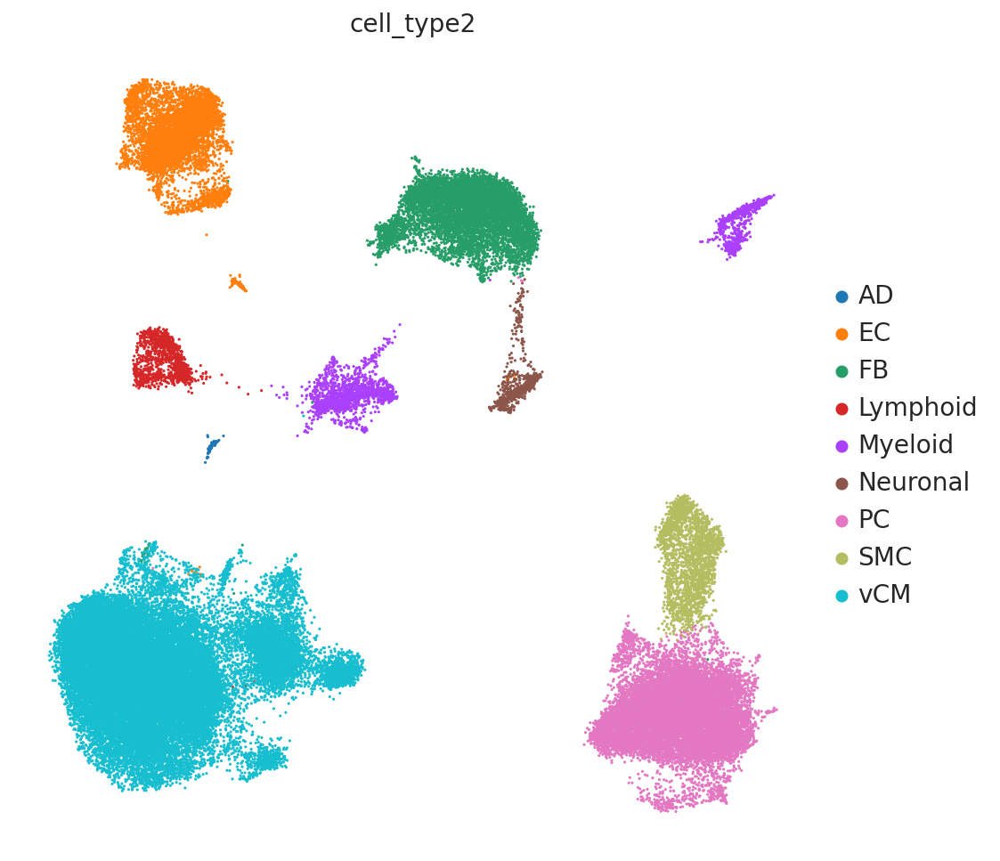

In [127]:
plt.rcParams['figure.figsize'] = [8, 8]
sc.pl.umap(adata_hvg, color = ['cell_type2'
                              ], size = 10, legend_fontsize = 14, frameon = False, ncols=1
          ,save='_celltype2.pdf')
plt.rcParams['figure.figsize'] = [5, 5]

In [121]:
obs=adata_hvg.obs.copy()
obs.cell_type2 = obs.cell_type2.cat.reorder_categories(['vCM','PC','FB','EC','SMC','Myeloid','Lymphoid','Neuronal','AD'])

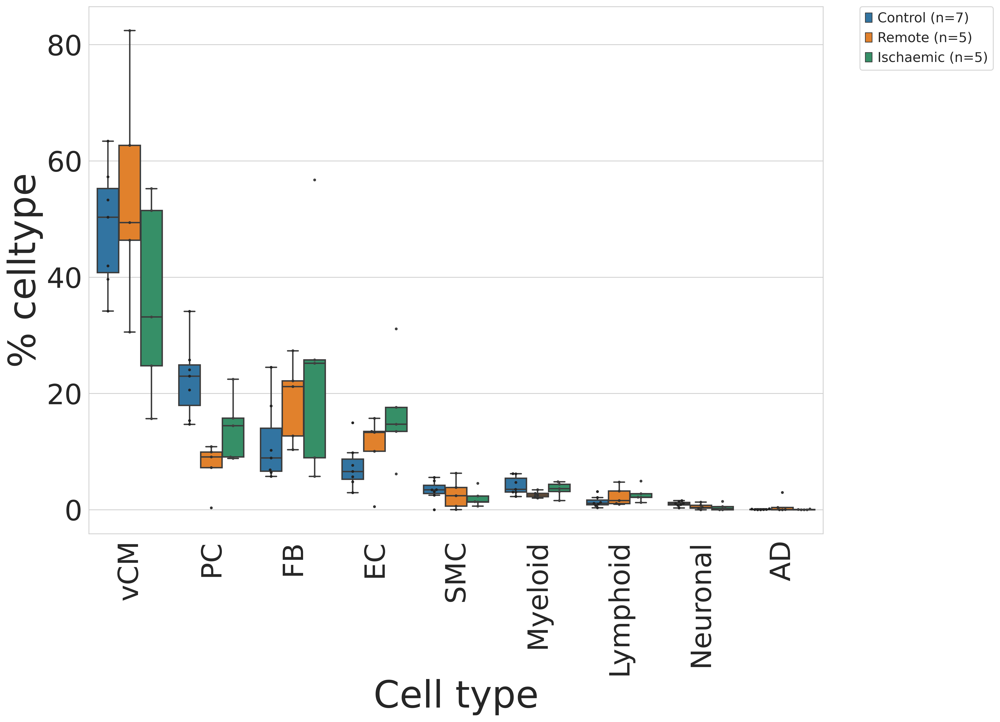

In [134]:
plot_celltype_abundance(obs,
                            variable='cell_type2', 
                            normalised_by=None, 
                            Genes_column='Location',
                            Genes_to_plot=[ 'Control', 'Remote', 'Ischaemic'], 
                            celltypes_to_plot=None, 
                            plottype="boxplot", 
                            show_points=True, return_table=False, save_png="celltype2_abundance_plot.pdf", ylimit=None)